In [ ]:
import os

# Define the parent directory
parent_dir = 'autonomous_driving'

# Define the child directories to create
dirs = [
    f'{parent_dir}/data/images',
    f'{parent_dir}/data/labels',
    f'{parent_dir}/models',
    f'{parent_dir}/outputs',
    f'{parent_dir}/notebooks'
]

# Create the directories
for d in dirs:
    os.makedirs(d, exist_ok=True)

print("Directory structure created successfully.")


Directory structure created successfully.


In [ ]:
import zipfile

zip_path = f'{parent_dir}/data/Images.zip'
extract_path = f'{parent_dir}/data/images/'

# Unzip Images.zip into the images folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Images unzipped successfully.")


Images unzipped successfully.


In [ ]:
import os

# Paths for splits
splits = ['train', 'val', 'test']
base_data_dir = 'autonomous_driving/data'

for split in splits:
    os.makedirs(f'{base_data_dir}/images/{split}', exist_ok=True)
    os.makedirs(f'{base_data_dir}/labels/{split}', exist_ok=True)

print("YOLOv5 directory structure created.")


YOLOv5 directory structure created.


In [ ]:
#2. Load and Inspect Labels
import pandas as pd

# Load the CSV
labels_path = 'autonomous_driving/data/labels/labels.csv'
df = pd.read_csv(labels_path)

# Display shape and first few rows
print("Shape:", df.shape)
display(df.head())

# Show column names
print("Columns:", df.columns.tolist())

# Check for missing values
print("Missing values per column:\n", df.isnull().sum())

# Check for duplicate rows
print("Duplicate rows:", df.duplicated().sum())


Shape: (351548, 6)


,00000000,pickup_truck,213,34,255,50
0,0,car,194,78,273,122
1,0,car,155,27,183,35
2,0,articulated_truck,43,25,109,55
3,0,car,106,32,124,45
4,1,bus,205,155,568,314


Columns: ['00000000', 'pickup_truck', '213', '34', '255', '50']
Missing values per column:
 00000000        0
pickup_truck    0
213             0
34              0
255             0
50              0
dtype: int64
Duplicate rows: 0


In [ ]:
#3. Match Images and Labels
#This checks for images in images/ that are missing labels, and labels that reference missing images:

#A. Check image extensions

import os

image_dir = '/content/autonomous_driving/data/images/Images'
all_files = os.listdir(image_dir)
image_exts = set(os.path.splitext(f)[1].lower() for f in all_files)
print("Image file extensions found:", image_exts)



Image file extensions found: {'.jpg'}


In [ ]:
#B. Build Full Image Filenames for Matching
# Pick one extension ('.jpg')
img_ext = '.jpg'  # Update if you have different/unique extension

df = pd.read_csv('/content/autonomous_driving/data/labels/labels.csv', header=None)
df.columns = ['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax']

df['full_filename'] = df['filename'].astype(str) + img_ext

# List of all images in folder
all_images = set(os.listdir(image_dir))

# Images referenced in labels.csv
csv_images = set(df['full_filename'].values)

missing_labels = all_images - csv_images
missing_images = csv_images - all_images

print("Images without labels:", missing_labels)
print("Labels without images:", missing_images)


Images without labels: {'00005635.jpg', '00005374.jpg', '00000118.jpg', '00004606.jpg', '00004418.jpg', '00002435.jpg', '00000880.jpg', '00000717.jpg', '00002864.jpg', '00003121.jpg', '00002947.jpg', '00001250.jpg', '00000282.jpg', '00001300.jpg', '00003269.jpg', '00005559.jpg', '00001676.jpg', '00002195.jpg', '00001701.jpg', '00000214.jpg', '00005124.jpg', '00005513.jpg', '00002256.jpg', '00002592.jpg', '00003749.jpg', '00004694.jpg', '00003659.jpg', '00005364.jpg', '00003397.jpg', '00003157.jpg', '00003480.jpg', '00003596.jpg', '00005112.jpg', '00003713.jpg', '00000003.jpg', '00004228.jpg', '00001917.jpg', '00000546.jpg', '00004464.jpg', '00004818.jpg', '00004133.jpg', '00002717.jpg', '00002794.jpg', '00003986.jpg', '00001991.jpg', '00004423.jpg', '00004234.jpg', '00002738.jpg', '00001578.jpg', '00000377.jpg', '00001263.jpg', '00005191.jpg', '00000034.jpg', '00000607.jpg', '00002431.jpg', '00000307.jpg', '00005115.jpg', '00005401.jpg', '00000618.jpg', '00000514.jpg', '00003415.jpg', 

Class mapping: {'articulated_truck': 0, 'bicycle': 1, 'bus': 2, 'car': 3, 'motorcycle': 4, 'motorized_vehicle': 5, 'non-motorized_vehicle': 6, 'pedestrian': 7, 'pickup_truck': 8, 'single_unit_truck': 9, 'work_van': 10}
Images without labels: {'00005635.jpg', '00005374.jpg', '00000118.jpg', '00004606.jpg', '00004418.jpg', '00002435.jpg', '00000880.jpg', '00000717.jpg', '00002864.jpg', '00003121.jpg', '00002947.jpg', '00001250.jpg', '00000282.jpg', '00001300.jpg', '00003269.jpg', '00005559.jpg', '00001676.jpg', '00002195.jpg', '00001701.jpg', '00000214.jpg', '00005124.jpg', '00005513.jpg', '00002256.jpg', '00002592.jpg', '00003749.jpg', '00004694.jpg', '00003659.jpg', '00005364.jpg', '00003397.jpg', '00003157.jpg', '00003480.jpg', '00003596.jpg', '00005112.jpg', '00003713.jpg', '00000003.jpg', '00004228.jpg', '00001917.jpg', '00000546.jpg', '00004464.jpg', '00004818.jpg', '00004133.jpg', '00002717.jpg', '00002794.jpg', '00003986.jpg', '00001991.jpg', '00004423.jpg', '00004234.jpg', '0000

Processing images: 100%|██████████| 110000/110000 [00:02<00:00, 42608.49it/s]

Conversion to YOLO format completed! YOLO label files saved in: /content/autonomous_driving/data/labels/yolo_labels


In [ ]:
#B. Build Full Image Filenames for Matching
# Pick one extension ('.jpg')
import os
import pandas as pd
from PIL import Image
from tqdm import tqdm

image_dir = '/content/autonomous_driving/data/images/Images'
labels_csv_path = '/content/autonomous_driving/data/labels/labels.csv'
output_label_dir = '/content/autonomous_driving/data/labels/yolo_labels'
os.makedirs(output_label_dir, exist_ok=True)

# Load CSV and map columns
df = pd.read_csv(labels_csv_path, header=None)
df.columns = ['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax']

# Zero-pad the filename to 8 digits
df['full_filename'] = df['filename'].apply(lambda x: f"{int(x):08d}.jpg")

# Class mapping
class_names = sorted(df['class'].unique())
class_to_id = {cls: i for i, cls in enumerate(class_names)}
print("Class mapping:", class_to_id)

# Only keep rows where image file exists
existing_images = set(os.listdir(image_dir))
df = df[df['full_filename'].isin(existing_images)]

print(f"Labels referencing existing images: {df.shape[0]}")

# Group all labels for a given image
grouped = df.groupby('full_filename')

missing_img_count = 0
for img_name, group in tqdm(grouped, desc='Converting labels'):
    img_path = os.path.join(image_dir, img_name)
    if not os.path.isfile(img_path):
        missing_img_count += 1
        continue

    # Get image size
    with Image.open(img_path) as im:
        w, h = im.size

    label_lines = []
    for _, row in group.iterrows():
        class_id = class_to_id[row['class']]
        xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
        x_center = ((xmin + xmax) / 2) / w
        y_center = ((ymin + ymax) / 2) / h
        width = (xmax - xmin) / w
        height = (ymax - ymin) / h
        label_line = f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
        label_lines.append(label_line)

    # Write YOLO label file
    txt_name = os.path.splitext(img_name)[0] + '.txt'
    with open(os.path.join(output_label_dir, txt_name), 'w') as f:
        f.write('\n'.join(label_lines))

print("Conversion complete.")
print(f"Missing images during conversion: {missing_img_count}")
print(f"Total YOLO label files created: {len(os.listdir(output_label_dir))}")


Class mapping: {'articulated_truck': 0, 'bicycle': 1, 'bus': 2, 'car': 3, 'motorcycle': 4, 'motorized_vehicle': 5, 'non-motorized_vehicle': 6, 'pedestrian': 7, 'pickup_truck': 8, 'single_unit_truck': 9, 'work_van': 10}
Labels referencing existing images: 17967


Converting labels: 100%|██████████| 5626/5626 [00:03<00:00, 1525.55it/s]

Conversion complete.
Missing images during conversion: 0
Total YOLO label files created: 5626


In [ ]:
#Validate Data/Labels

import os

image_dir = '/content/autonomous_driving/data/images/Images'
label_dir = '/content/autonomous_driving/data/labels/yolo_labels'

# List all images and labels
images = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
labels = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

print(f"Images found: {len(images)}")
print(f"Label files found: {len(labels)}")

# Check image-label pairing
missing_labels = [img for img in images if img.replace('.jpg', '.txt') not in labels]
missing_images = [lbl for lbl in labels if lbl.replace('.txt', '.jpg') not in images]
print(f"Images without label file: {missing_labels[:10]} (total: {len(missing_labels)})")
print(f"Labels without image file: {missing_images[:10]} (total: {len(missing_images)})")

# Check for empty label files
empty_labels = [lbl for lbl in labels if os.path.getsize(os.path.join(label_dir, lbl)) == 0]
print(f"Empty label files: {empty_labels[:10]} (total: {len(empty_labels)})")


Images found: 5626
Label files found: 5626
Images without label file: [] (total: 0)
Labels without image file: [] (total: 0)
Empty label files: [] (total: 0)


In [ ]:
#split: Train: 70%, Validation: 20%, Test: 10%
import os
import random
import shutil
from tqdm import tqdm

# Set random seed for reproducibility
random.seed(42)

# Source paths
image_dir = '/content/autonomous_driving/data/images/Images'
label_dir = '/content/autonomous_driving/data/labels/yolo_labels'

# Output base paths
output_base = '/content/autonomous_driving/data'
splits = ['train', 'val', 'test']
split_ratio = [0.7, 0.2, 0.1]  # 70% train, 20% val, 10% test

# Get all image files (with labels already verified)
all_images = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
random.shuffle(all_images)

n_total = len(all_images)
n_train = int(n_total * split_ratio[0])
n_val = int(n_total * split_ratio[1])

train_files = all_images[:n_train]
val_files = all_images[n_train:n_train + n_val]
test_files = all_images[n_train + n_val:]

split_files = {
    'train': train_files,
    'val': val_files,
    'test': test_files
}

# Ensure output folders exist
for split in splits:
    os.makedirs(f"{output_base}/images/{split}", exist_ok=True)
    os.makedirs(f"{output_base}/labels/{split}", exist_ok=True)

# Copy images and labels
for split in splits:
    print(f"Copying {split} set...")
    for img_file in tqdm(split_files[split]):
        # Copy image
        src_img = os.path.join(image_dir, img_file)
        dst_img = os.path.join(output_base, 'images', split, img_file)
        shutil.copy2(src_img, dst_img)
        # Copy label
        label_file = img_file.replace('.jpg', '.txt')
        src_lbl = os.path.join(label_dir, label_file)
        dst_lbl = os.path.join(output_base, 'labels', split, label_file)
        shutil.copy2(src_lbl, dst_lbl)

print("Dataset split and file movement completed.")


Copying train set...


100%|██████████| 3938/3938 [00:00<00:00, 4272.72it/s]


Copying val set...


100%|██████████| 1125/1125 [00:00<00:00, 3943.23it/s]


Copying test set...


100%|██████████| 563/563 [00:00<00:00, 4300.62it/s]

Dataset split and file movement completed.


In [ ]:
#Install YOLOv5 in Colab

# Clone the YOLOv5 repository and install dependencies
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17521, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 17521 (delta 9), reused 0 (delta 0), pack-reused 17497 (from 4)
Receiving objects: 100% (17521/17521), 16.62 MiB | 13.22 MiB/s, done.
Resolving deltas: 100% (12005/12005), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 

In [ ]:
#2. Prepare the YOLOv5 Dataset YAML
data_yaml = """
train: /content/autonomous_driving/data/images/train
val: /content/autonomous_driving/data/images/val

nc: 11
names: ['articulated_truck', 'bicycle', 'bus', 'car', 'motorcycle', 'motorized_vehicle', 'non-motorized_vehicle', 'pedestrian', 'pickup_truck', 'single_unit_truck', 'work_van']
"""

with open('/content/yolov5/vehicle_data.yaml', 'w') as f:
    f.write(data_yaml)
print("vehicle_data.yaml created!")


vehicle_data.yaml created!


In [ ]:
#3. Train YOLOv5s (small model) for best speed on Colab
import torch

# Make sure the repo is cloned and requirements installed
# If not already done, uncomment and run:
# !git clone https://github.com/ultralytics/yolov5.git
# %cd yolov5
# !pip install -r requirements.txt

# Train the model (yolov5s is the small model, fastest for Colab)
from yolov5 import train

train.run(
    data='/content/yolov5/vehicle_data.yaml',
    imgsz=640,
    batch=16,
    epochs=30,
    weights='yolov5s.pt',
    name='vehicle_yolov5s'
)


Streaming output truncated to the last 5000 lines.
      20/29      3.99G    0.02607    0.01923    0.01126         88        640:   2%|▏         | 5/247 [00:01<01:22,  2.92it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      20/29      3.99G    0.02555    0.01851    0.01093         83        640:   2%|▏         | 6/247 [00:01<01:18,  3.06it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      20/29      3.99G    0.02687    0.01853    0.01138         85        640:   3%|▎         | 7/247 [00:02<01:35,  2.52it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
 

Namespace(weights='yolov5s.pt', cfg='', data='/content/yolov5/vehicle_data.yaml', hyp={'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=PosixPath('data/hyps'), resume_evolve=None, bucket='', cache=None, image_weights=False, device='', multi_scale=False, single_cls=False, optimizer='SGD', sync_bn=False, workers=8, project='runs/train', name='vehicle_yolov5s', exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=10

In [ ]:
# After Training: Save the Model to Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Path to best weights (automatically saved by YOLOv5)
best_weights_path = '/content/yolov5/runs/train/vehicle_yolov5s/weights/best.pt'
drive_path = '/content/drive/MyDrive/docs/AI/simplilearn/Capstone/Datasets1/Autonomous_Driving/best_vehicle_yolov5s.pt'

# Copy to Google Drive
import shutil
shutil.copy(best_weights_path, drive_path)
print("Model weights copied to Google Drive at:", drive_path)


Mounted at /content/drive
Model weights copied to Google Drive at: /content/drive/MyDrive/docs/AI/simplilearn/Capstone/Datasets1/Autonomous_Driving/best_vehicle_yolov5s.pt


In [ ]:
#To Load and Use Later for Inference (Python API)
import torch

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Load model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/docs/AI/simplilearn/Capstone/Datasets1/Autonomous_Driving/best_vehicle_yolov5s.pt', source='local')

# Inference example
results = model('/content/autonomous_driving/data/images/test/00000123.jpg')  # change to your test image path
results.show()  # Display annotated image


In [ ]:
import os

runs_dir = '/content/yolov5/runs/train'
runs = os.listdir(runs_dir)
print("Available runs:", runs)


Available runs: ['vehicle_yolov5s']


In [ ]:
import os

output_dir = '/content/yolov5/runs/train/vehicle_yolov5s'
print("Files in output folder:", os.listdir(output_dir))


Files in output folder: ['val_batch1_labels.jpg', 'opt.yaml', 'labels_correlogram.jpg', 'train_batch0.jpg', 'weights', 'P_curve.png', 'F1_curve.png', 'val_batch1_pred.jpg', 'val_batch2_pred.jpg', 'confusion_matrix.png', 'train_batch2.jpg', 'PR_curve.png', 'train_batch1.jpg', 'results.png', 'results.csv', 'val_batch2_labels.jpg', 'val_batch0_labels.jpg', 'hyp.yaml', 'labels.jpg', 'events.out.tfevents.1754458059.03cfa15ca04e.1275.0', 'R_curve.png', 'val_batch0_pred.jpg']


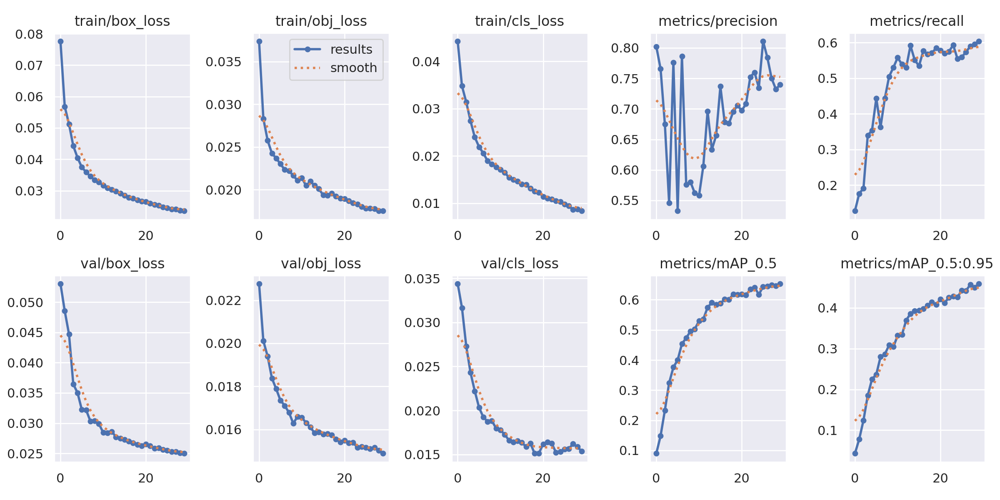

In [ ]:
#1. Visualize Training/Validation Metrics

from IPython.display import Image as IPyImage, display

results_img_path = '/content/yolov5/runs/train/vehicle_yolov5s/results.png'
display(IPyImage(filename=results_img_path))


In [ ]:
# 2. Read and Display results.csv (Metrics Per Epoch)
import pandas as pd

results_csv = '/content/yolov5/runs/train/vehicle_yolov5s/results.csv'
df = pd.read_csv(results_csv)
print(df.tail())  # Show last few epochs (final metrics)


                epoch     train/box_loss     train/obj_loss  \
25                 25           0.024434           0.017796   
26                 26           0.024134           0.017797   
27                 27           0.024034           0.017762   
28                 28           0.023667           0.017542   
29                 29           0.023525           0.017510   

       train/cls_loss  metrics/precision  ...       val/obj_loss  \
25           0.009848            0.81084  ...           0.015168   
26           0.009446            0.78395  ...           0.015100   
27           0.008691            0.74985  ...           0.015170   
28           0.008738            0.73207  ...           0.015024   
29           0.008390            0.74006  ...           0.014885   

         val/cls_loss              x/lr0              x/lr1              x/lr2  
25           0.015606            0.00208            0.00208            0.00208  
26           0.015650            0.00175          

In [ ]:
import pandas as pd

results_csv = '/content/yolov5/runs/train/vehicle_yolov5s/results.csv'
df = pd.read_csv(results_csv)

# Show all columns and the last 5 epochs
pd.set_option('display.max_columns', None)
print(df.tail())


                   epoch        train/box_loss        train/obj_loss  \
25                    25              0.024434              0.017796   
26                    26              0.024134              0.017797   
27                    27              0.024034              0.017762   
28                    28              0.023667              0.017542   
29                    29              0.023525              0.017510   

          train/cls_loss     metrics/precision        metrics/recall  \
25              0.009848               0.81084               0.55976   
26              0.009446               0.78395               0.57361   
27              0.008691               0.74985               0.58996   
28              0.008738               0.73207               0.59630   
29              0.008390               0.74006               0.60396   

         metrics/mAP_0.5  metrics/mAP_0.5:0.95          val/box_loss  \
25               0.64347               0.44244              0.

| Metric            | Value | What It Means                                               |
| ----------------- | ----- | ----------------------------------------------------------- |
| **Precision**     | 0.74  | Of all predicted objects, 74% were correct.                 |
| **Recall**        | 0.60  | Model finds 60% of all true objects.                        |
| **mAP\@0.5**      | 0.65  | Average precision at IoU 0.5. (Good: >0.5, Very good: >0.7) |
| **mAP\@0.5:0.95** | 0.46  | Stricter, averages over IoU thresholds.                     |


In [ ]:
# Remove any old folder (just in case)
#!rm -rf /content/yolov5
#!mkdir -p /content/yolov5

# Clone YOLOv5 repository
#!git clone https://github.com/ultralytics/yolov5.git /content/yolov5

# Change to YOLOv5 directory
%cd /content/yolov5

# Install requirements (only needs to be done once per session)
!pip install -r requirements.txt


/content/yolov5


YOLOv5 🚀 v7.0-423-g567c6646 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7039792 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


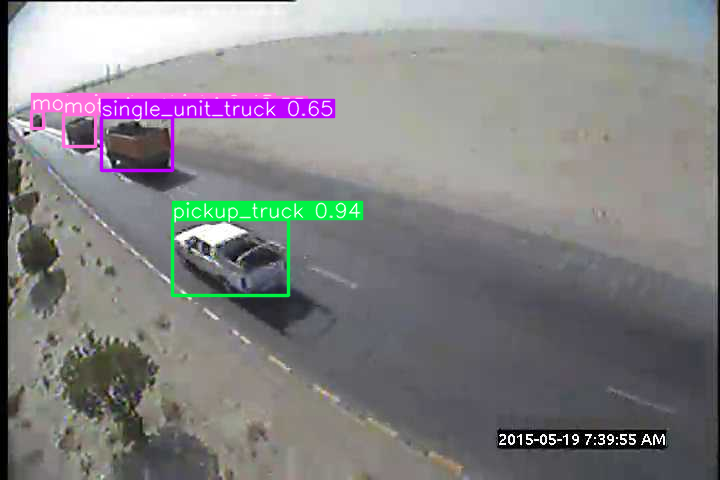

Saved 1 image to /content/yolov5/inference_results6
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


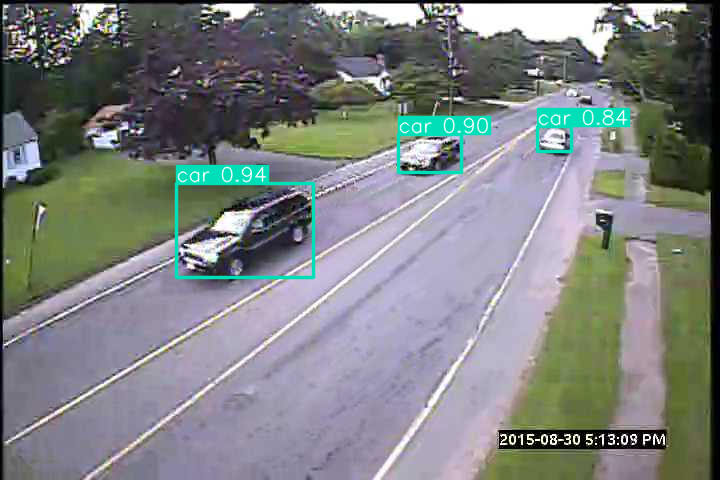

Saved 1 image to /content/yolov5/inference_results7
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


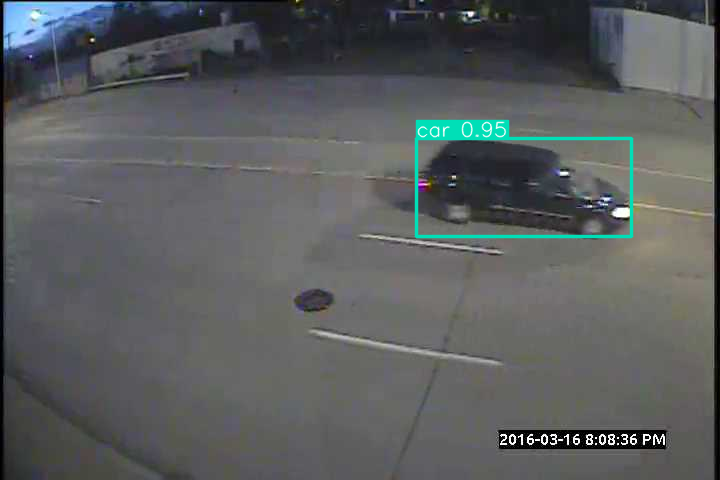

Saved 1 image to /content/yolov5/inference_results8
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


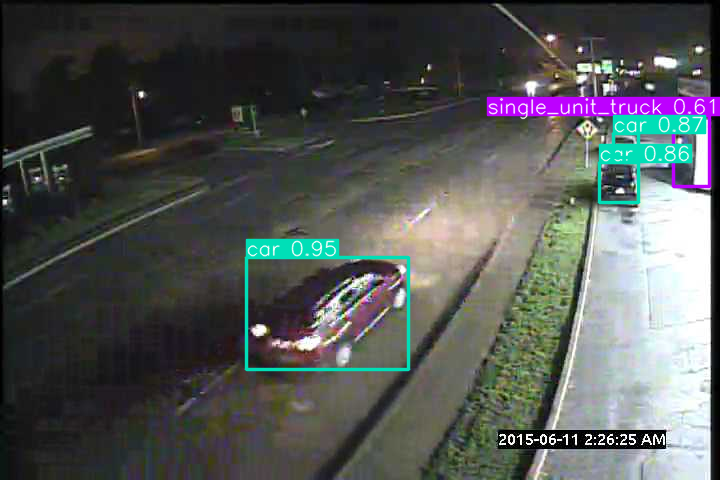

Saved 1 image to /content/yolov5/inference_results9
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


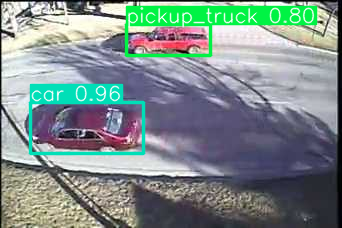

Saved 1 image to /content/yolov5/inference_results10
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


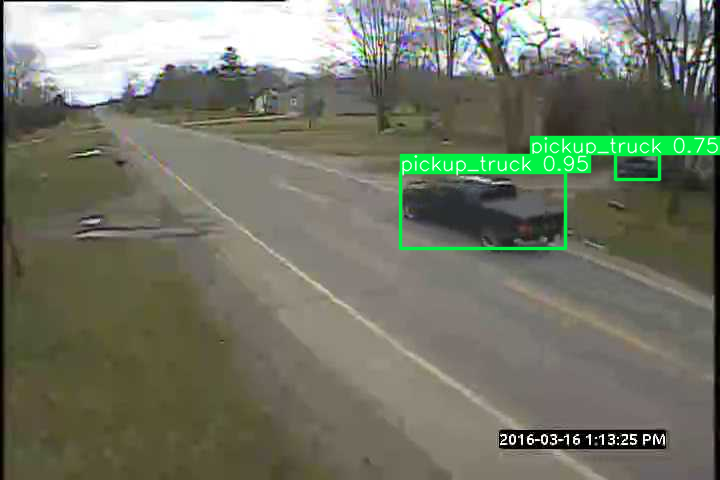

Saved 1 image to /content/yolov5/inference_results11
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


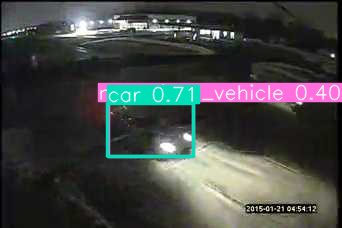

Saved 1 image to /content/yolov5/inference_results12
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


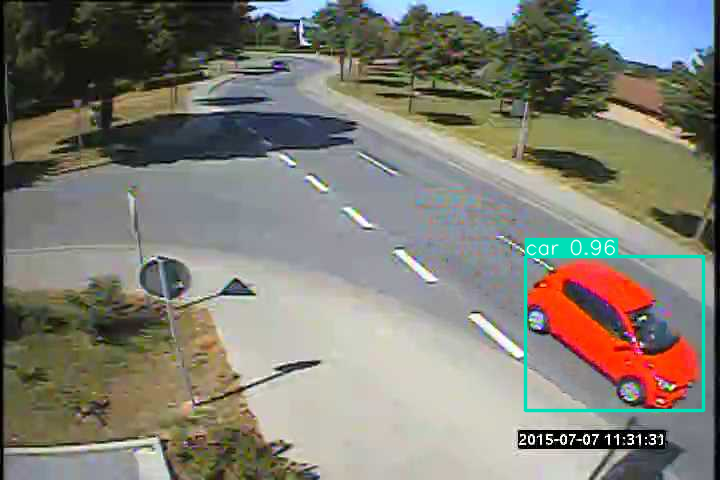

Saved 1 image to /content/yolov5/inference_results13
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


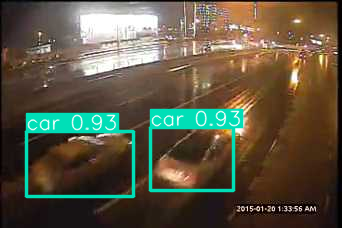

Saved 1 image to /content/yolov5/inference_results14
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


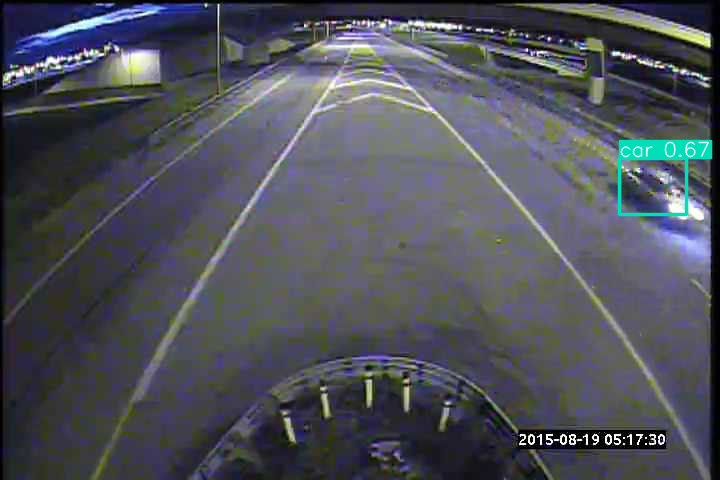

Saved 1 image to /content/yolov5/inference_results15
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


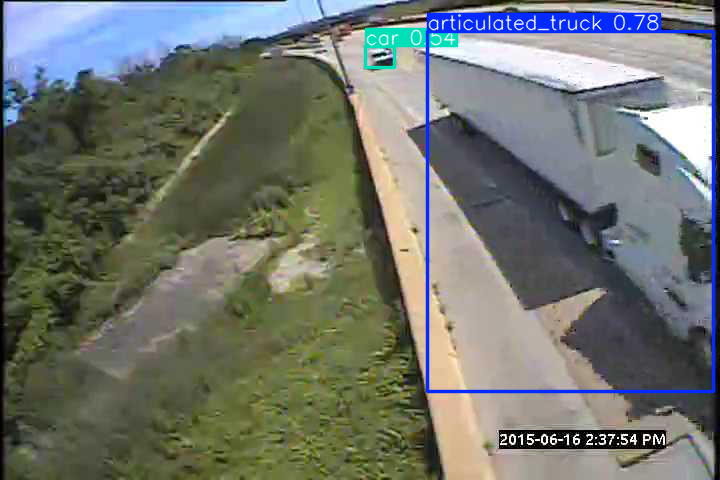

Saved 1 image to /content/yolov5/inference_results16
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


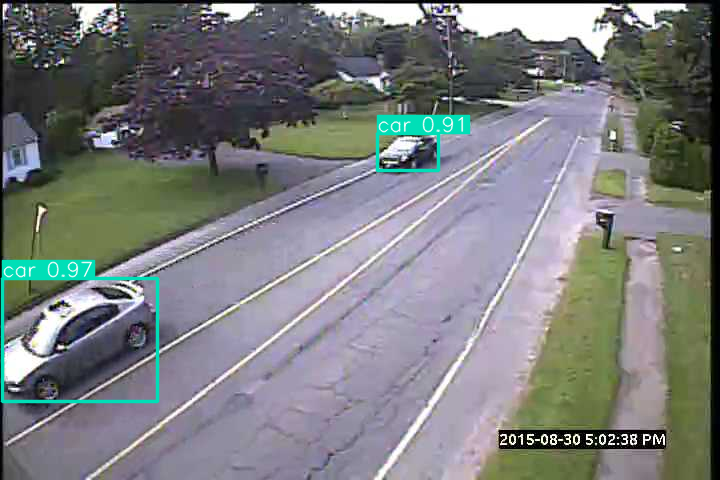

Saved 1 image to /content/yolov5/inference_results17
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


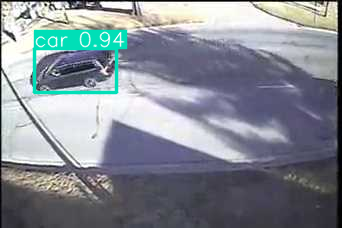

Saved 1 image to /content/yolov5/inference_results18
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


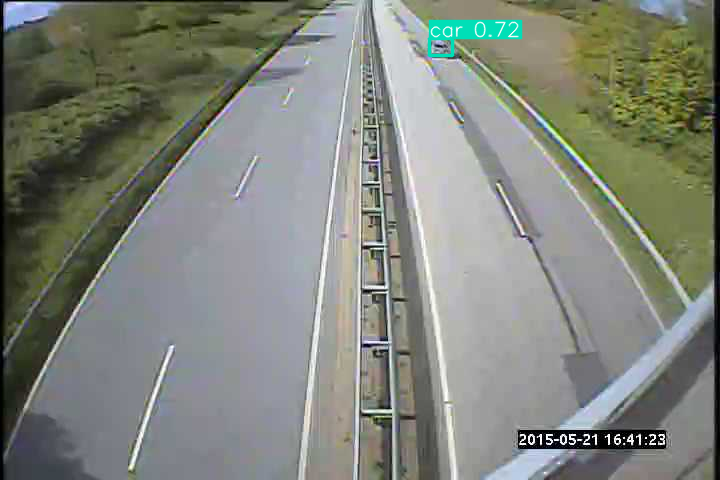

Saved 1 image to /content/yolov5/inference_results19
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


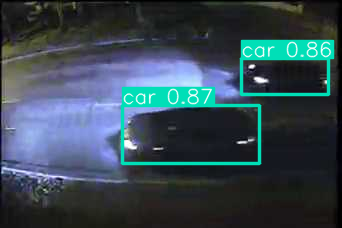

Saved 1 image to /content/yolov5/inference_results20
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


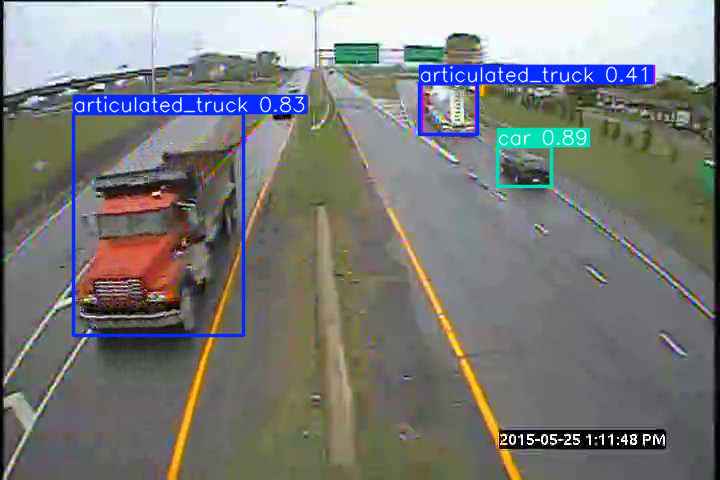

Saved 1 image to /content/yolov5/inference_results21
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


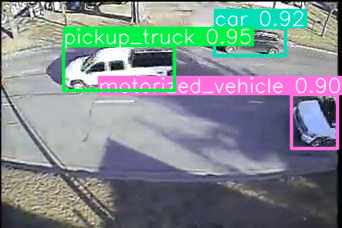

Saved 1 image to /content/yolov5/inference_results22
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


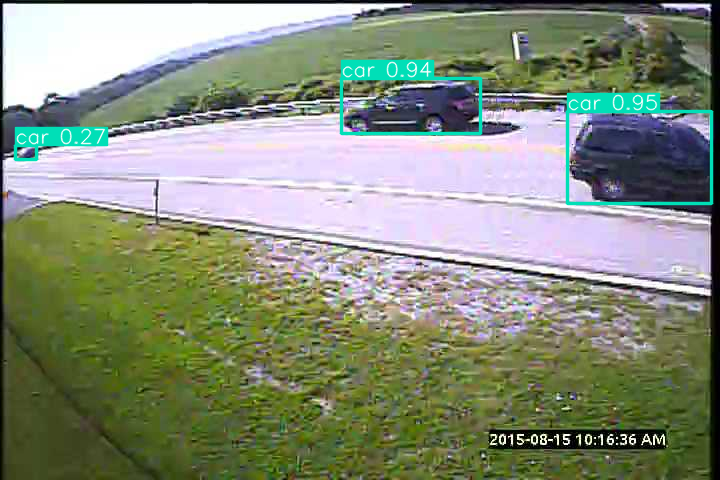

Saved 1 image to /content/yolov5/inference_results23
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


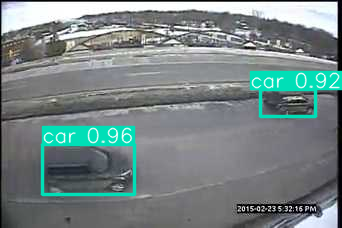

Saved 1 image to /content/yolov5/inference_results24
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


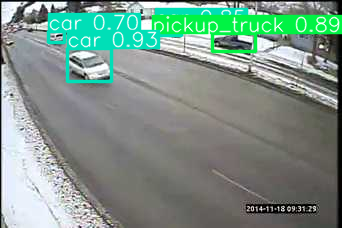

Saved 1 image to /content/yolov5/inference_results25


Done! Check '/content/yolov5/inference_results/' for saved output images.


In [ ]:
# 2. Load your trained model
import torch

weights_path = '/content/yolov5/best_vehicle_yolov5s.pt'  # update path if needed
model = torch.hub.load('.', 'custom', path=weights_path, source='local')  # Load from current folder

# 3. Predict & visualize on random test images
import os, random

test_dir = '/content/autonomous_driving/data/images/test'
test_images = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith('.jpg')]

# Select 5 random images for demonstration
sample_imgs = random.sample(test_images, 20)

# Run prediction and show results in Colab
for img_path in sample_imgs:
    results = model(img_path)
    results.show()  # display result in output cell
    # Optionally save images with boxes:
    results.save(save_dir='/content/yolov5/inference_results/')

print("Done! Check '/content/yolov5/inference_results/' for saved output images.")


In [ ]:
import shutil
from google.colab import files

# 1. Path to your YOLOv5 training run results (update if your folder name is different)
results_dir = '/content/yolov5'

# 2. Zip the entire folder
shutil.make_archive('/content/vehicle_yolov5s_results', 'zip', results_dir)

# 3. Download the zipped folder
files.download('/content/vehicle_yolov5s_results.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>